# **Equipo 2**

## **Proyecto: Cancer de mama en México**

### Análisis exploratorio y espacial de bases de datos de SICAM

#### Integrantes:
- Zoé Ariel García Martínez
- Atenea De La Cruz Brito
- Juan Luis Carrillo de la Cruz

A partir de la obteción y limpeza de los datos del SICAM es posible analizar las mastográfias hechas por estados, abarcando del 2013 al 2019, teniendo una falta de datos en el 2018 debido a que el enlace estaba caído.

Esta base de datos fue previamienta trabajada y se trabajara a partir de la siguiente forma:

In [1]:
# Importamos las librerias y obtenemos 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn  as sns
import folium
import geopandas as gpd
sns.set(style='whitegrid')

In [2]:
sicam13_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2013_SICAM_estado.csv", index_col=0)
sicam13_estado.head()

,resultado,estado,count
0,Altamente Sugestiva a Malignidad,Aguascalientes,31
1,Altamente Sugestiva a Malignidad,Baja California,31
2,Altamente Sugestiva a Malignidad,Baja California Sur,2
3,Altamente Sugestiva a Malignidad,Campeche,25
4,Altamente Sugestiva a Malignidad,Chiapas,1


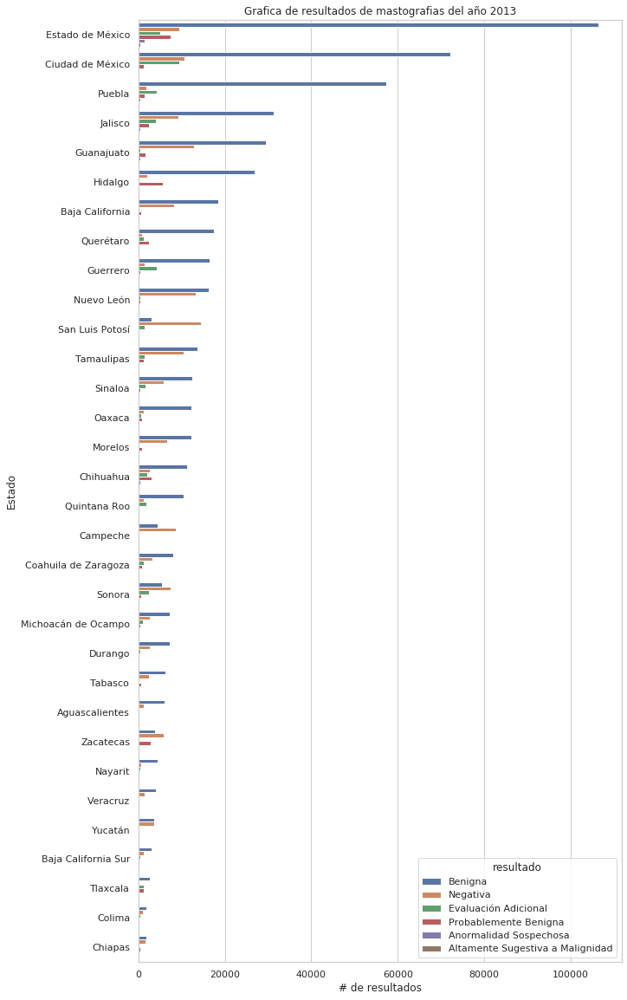

In [3]:
# Graficas de barras
fig = plt.figure(figsize=(10,20))
ax = sns.barplot(x='count', y='estado', data=sicam13_estado.sort_values(by='count', ascending=False), orient='h', hue='resultado') #dodge = false
ax.set_title('Grafica de resultados de mastografias del año 2013')
ax.set(xlabel='# de resultados', ylabel='Estado');

Ya que la grafica de barras nos indica una gran diferencia entre los estados, la mejor manera de comunicar este tipo de datos es hacerlo usando mapas. 

In [4]:
# cargamos el geojson con la geometria de los estados de México
mexico = '../Equipo_2_P2_Analisis/DATA/mexico.json'
fname = mexico
mxn = gpd.read_file(fname)
mxn = mxn[1:][['name', 'geometry']]
mxn = mxn.rename(columns= {'name': 'estado'})
mxn

,estado,geometry
1,Baja California,"MULTIPOLYGON (((-114.14750 28.00015, -114.2070..."
2,Baja California Sur,"MULTIPOLYGON (((-109.79843 24.15516, -109.8624..."
3,Coahuila,"POLYGON ((-99.80696 27.77142, -99.96720 27.640..."
4,Chihuahua,"POLYGON ((-106.50605 31.77026, -106.42895 31.7..."
5,Durango,"POLYGON ((-103.62726 26.64393, -103.32570 26.4..."
6,Sinaloa,"MULTIPOLYGON (((-108.88272 25.44318, -108.8188..."
7,Sonora,"MULTIPOLYGON (((-109.23137 26.26342, -109.2254..."
8,Zacatecas,"POLYGON ((-100.82844 24.56496, -100.86968 24.4..."
9,Nuevo León,"POLYGON ((-99.80696 27.77142, -99.74044 27.722..."
10,San Luis Potosí,"POLYGON ((-100.05727 23.24106, -100.08926 23.1..."


In [5]:
# realizamos la funcion de un mapa multicapa

def map_mul(jsn, data, var, count,  location, zoom, title='Titulo', res='Resultados'):
    '''
    Funcion que entrega un "Choropleth map" multicapa,
    útil para realizar mapas de diferentes variables
    en un mimso data set. Es necesario tener un geojson
    con los valores a usar (e.j. poligonos)
    
    jsn: geojson que contiene los valores espaciales
    data: Dataframe de los datos
    var: variable que queremos localizer
    count: conteo de los datos de la variable a usar
    title: titulo.
    res: Titulo de los resultados.
    location: centro del mapa [y,x]
    zoom: zoom de la capa
    
    Nota: por el momento solo funciona con geojson usado en 
    clase, falta poder dar las propiedad de forma correcta 
    en la variable 'key_on' de folium.Choropleth
    '''
    
    # Usamos un array con los nombres de las variables para el loop que preparara el mapa
    res = pd.unique(data[var])
    
    # usando folium realizamos el mapa con diferentes capas
    mymap =  folium.Map(location=location, zoom_start=zoom, width="100%", height='100%')
    for i in range(0,len(res)):
        folium.Choropleth(
            geo_data = jsn,
            name=f'{title} {res[i]}',
            data=data[data[var]  == res[i]],
            columns=[var, count],
            key_on='feature.properties.estado',
            fill_color='YlGn',
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name=f'{res} {res[i]}'
        ).add_to(mymap)
        
    folium.LayerControl().add_to(mymap)
    
    return mymap


# Intente realizar la funcion y arroja el mapa, pero no imprime nada a pesar de darme el bjeto de folium.

In [6]:
# renombramos los datos y los preparamos para el mapa
renombre = {
    'Coahuila de Zaragoza': 'Coahuila',
    'Ciudad de México': 'Distrito Federal',
    'Michoacán de Ocampo': 'Michoacán',
    'Veracruz de Ignacio de la Llave': 'Veracruz',
    'Estado de México': 'México'
}

sicam13_estado = sicam13_estado.replace({"estado": renombre})

In [7]:
# Usamos un array con los nombres de las variables para el loop que preparara el mapa
res = pd.unique(sicam13_estado['resultado'])

# usando folium realizamos el mapa con diferentes capas
mymap =  folium.Map(location=[25, -100], zoom_start=4.4, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam13_estado[sicam13_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

A partir del mapa anterior, de forma interactiva es posible ver, según los diferents resultados, que estados tienen una mayor o un menor numero de tumores benignos, por poner un ejemplo. Se realizaran mapas para los siguientes años.

In [8]:
#  2014
sicam14_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2014_SICAM_estado.csv", index_col=0)
sicam14_estado = sicam14_estado.replace({"estado": renombre})

res = pd.unique(sicam14_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam14_estado[sicam14_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap


In [10]:
#  2015
sicam15_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2015_SICAM_estado.csv", index_col=0)
sicam15_estado = sicam15_estado.replace({"estado": renombre})

res = pd.unique(sicam15_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam15_estado[sicam15_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap


In [11]:
#  2016
sicam16_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2016_SICAM_estado.csv", index_col=0)
sicam16_estado = sicam16_estado.replace({"estado": renombre})

res = pd.unique(sicam16_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam16_estado[sicam16_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

In [12]:
#  2017
sicam17_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2017_SICAM_estado.csv", index_col=0)
sicam17_estado = sicam17_estado.replace({"estado": renombre})

res = pd.unique(sicam17_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam17_estado[sicam17_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

In [14]:
#  2019
sicam19_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2019_SICAM_estado.csv", index_col=0)
sicam19_estado = sicam19_estado.replace({"estado": renombre})

res = pd.unique(sicam19_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam19_estado[sicam19_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

A partir de los mapas es posible visualizar los datos para cada año y su distribución en los diferentes estados de la Republica Mexicana, pero ahora veremos los datos para el rango de 2013 a 2019, cuantas mastografias de hicieron de acuerdo a la edad, en diferentes graficos.